# Machine Learning Assignment 3: Linear Models

### Luis Quiñones, Lluisa Rull Farran, Pearl Herrero

In [ ]:
# Import modules

import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.metrics import r2_score
from sklearn import model_selection, tree, preprocessing, metrics, linear_model
from sklearn.linear_model import Lasso, Ridge, LinearRegression, ElasticNet, LassoLarsIC
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.cluster import KMeans
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Import data

files = ['Case_data_dictionary.xlsx', 
         'Regression_Supervised_Test.csv', 
         'Regression_Supervised_Train.csv', 
         'real_estate_kaggle_sample_submission.csv']

path = 'real-estate-valuation-with-linear-models-2022/'

data_dict = pd.read_excel(path + files[0],
                          sheet_name = ['DataDictionary',
                                        'heatingtype',
                                        'storytype', 
                                        'aircond', 
                                        'style', 
                                        'material',
                                        'classbuild'])

reg_test = pd.read_csv(path + files[1], sep = ';', thousands = ',')
reg_train = pd.read_csv(path + files[2], sep =';', thousands = ',')
keg_sample = pd.read_csv(path + files[3], thousands = ',')

reg_train1 = reg_train.copy()
reg_test1 = reg_test.copy()

## Data Exploration

An important first step prior to doing anything to the data set is to understand the data itself. We check for the shape, `NaN` values, distribution of important variables and how potential predictors interact with each other.


In [ ]:
# Check first few rows of training set
reg_train1.head

<bound method NDFrame.head of           lotid  logerror transactiondate  aircond  style  basement  numbath  \
0      17214744       NaN             NaN      NaN    NaN       NaN      2.0   
1      12018724       NaN             NaN      1.0    NaN       NaN      2.0   
2      11306699       NaN             NaN      1.0    NaN       NaN      3.0   
3      11047729       NaN             NaN      1.0    NaN       NaN      2.0   
4      17174848       NaN             NaN      NaN    NaN       NaN      3.0   
...         ...       ...             ...      ...    ...       ...      ...   
21995  10982446       NaN             NaN      1.0    NaN       NaN      2.0   
21996  10848224       NaN             NaN      NaN    NaN       NaN      2.0   
21997  14099461       NaN             NaN      5.0    NaN       NaN      3.0   
21998  10711918       NaN             NaN      1.0    NaN       NaN      3.0   
21999  11102460       NaN             NaN      1.0    NaN       NaN      2.0   

       nu

In [ ]:
# Check first few rows of testing set
reg_test1.head

<bound method NDFrame.head of         lotid  logerror transactiondate  aircond  style  basement  numbath  \
0    10987932       NaN             NaN      NaN    NaN       NaN      1.0   
1    17171405       NaN             NaN      NaN    NaN       NaN      2.0   
2    10790981    -0.002         22/7/16      1.0    NaN       NaN      3.0   
3    14531417       NaN             NaN      NaN    7.0       NaN      2.0   
4    11072694       NaN             NaN      1.0    NaN       NaN      3.0   
..        ...       ...             ...      ...    ...       ...      ...   
195  10766230       NaN             NaN      1.0    NaN       NaN      2.0   
196  14412894       NaN             NaN      1.0    NaN       NaN      2.5   
197  11039638       NaN             NaN      1.0    NaN       NaN      3.0   
198  17162761       NaN             NaN      NaN    NaN       NaN      2.0   
199  10871875       NaN             NaN      1.0    NaN       NaN      2.0   

     numbedroom  classbuild  qual

In [ ]:
# Check the number of rows and columns in the training set
reg_train1.shape

(22000, 48)

In [ ]:
# Check the number of rows and columns in the testing set
reg_test1.shape

(200, 47)

In [ ]:
# Undertand the distribution of each variable in the training set
reg_train1.describe()

,lotid,logerror,aircond,style,basement,numbath,numbedroom,classbuild,qualitybuild,decktype,...,unitnum,year,numstories,buildvalue,taxyear,landvalue,totaltaxvalue,taxdelinquencyyear,mypointer,parcelvalue
count,2.200000e+04,1.578000e+03,12867.00000,211.000000,46.000000,22000.000000,22000.000000,15.000000,13059.000000,633.0,...,13157.000000,21990.000000,8525.000000,2.199800e+04,22000.000000,2.200000e+04,21999.000000,786.000000,22000.000000,2.200000e+04
mean,1.334922e+07,-4.898606e+05,2.09808,7.156398,587.478261,2.605500,3.296727,3.800000,5.633816,66.0,...,1.006916,1972.898136,1.539355,3.048674e+05,2015.282227,4.000782e+05,6685.907196,13.958015,17646.926636,6.671179e+05
std,3.546074e+06,1.945925e+07,3.37171,2.155656,499.813598,1.049745,1.074839,0.414039,2.259388,0.0,...,0.130010,18.681986,0.530847,1.899190e+06,0.450094,2.430582e+06,9073.022236,1.540789,10221.937701,4.726451e+06
min,1.071173e+07,-7.730000e+08,1.00000,2.000000,68.000000,0.000000,0.000000,3.000000,1.000000,66.0,...,1.000000,1880.000000,1.000000,1.010000e+02,2015.000000,1.300000e+02,49.080000,6.000000,1.000000,1.831100e+04
25%,1.108034e+07,-2.767557e-02,1.00000,7.000000,204.000000,2.000000,3.000000,4.000000,4.000000,66.0,...,1.000000,1961.000000,1.000000,1.143285e+05,2015.000000,9.487950e+04,3042.430000,14.000000,8823.750000,2.399270e+05
50%,1.212346e+07,5.032821e-03,1.00000,7.000000,483.000000,2.500000,3.000000,4.000000,4.000000,66.0,...,1.000000,1974.000000,2.000000,1.725815e+05,2015.000000,1.938315e+05,4743.260000,14.000000,17616.500000,3.842280e+05
75%,1.467735e+07,3.630000e-02,1.00000,7.000000,788.750000,3.000000,4.000000,4.000000,7.000000,66.0,...,1.000000,1985.000000,2.000000,2.638532e+05,2016.000000,3.557070e+05,7399.950000,15.000000,26520.500000,6.103528e+05
max,1.629608e+08,2.489000e+00,13.00000,21.000000,2485.000000,19.000000,11.000000,4.000000,12.000000,66.0,...,9.000000,2016.000000,3.000000,1.000000e+08,2016.000000,1.000000e+08,311386.080000,15.000000,35363.000000,6.000000e+08


In [ ]:
# Check the percentage and the number of missing values for each variable 

total = reg_train1.isnull().sum().sort_values(ascending = False)
percent = (reg_train1.isnull().sum() / reg_train1.isnull().count()).sort_values(ascending = False)
missing_data = pd.concat([total, percent], axis = 1, keys = ['Total', 'Percent'])

missing_data

,Total,Percent
perimeterarea,22000,1.000000
classbuild,21985,0.999318
basement,21954,0.997909
storytype,21954,0.997909
totalarea,21943,0.997409
fireplace,21836,0.992545
style,21789,0.990409
material,21774,0.989727
decktype,21367,0.971227
taxdelinquencyyear,21214,0.964273


We observe that multiple variables contain a large percentage of `NaN` values. We also view `NaN` values for our testing set.

In [ ]:
# Do the same for the testing set

total_test = reg_test1.isnull().sum().sort_values(ascending = False)
percent_test = (reg_test1.isnull().sum() / reg_test1.isnull().count()).sort_values(ascending = False)
missing_data_test = pd.concat([total_test, percent_test], axis = 1, keys = ['Total', 'Percent'])

missing_data_test

,Total,Percent
totalarea,200,1.000
perimeterarea,200,1.000
classbuild,200,1.000
basement,199,0.995
material,199,0.995
storytype,199,0.995
style,199,0.995
fireplace,198,0.990
decktype,196,0.980
taxdelinquencyyear,193,0.965


<AxesSubplot:>

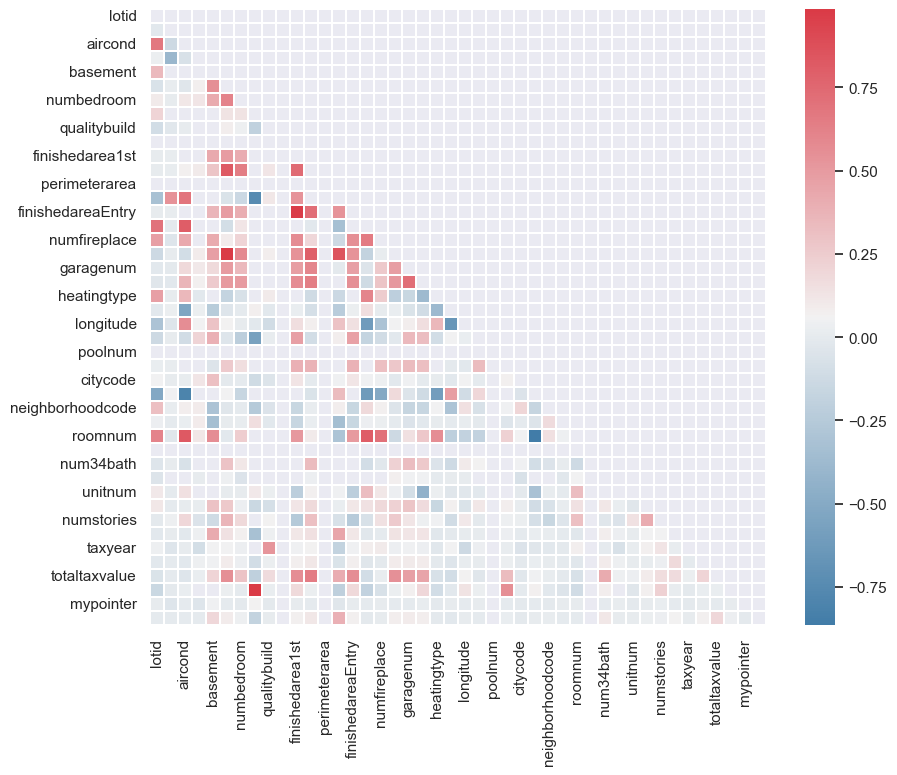

In [ ]:
# Check the correlation between variables

sns.set_theme(style="dark")

# Compute the correlation matrix
corr = reg_train1.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, square=True, linewidths=.2) 

At first sight, before dropping and imputing missing data we notice the following pairs of variables to be highly correlated:

+ `numfullbath` and `numbath` 
+ `finishedareaEntry` and `finishedareafirst`
+ `countycode` and `countycode2`

High correlation between predictors poses a problem as this introduces multicollinearity when performing regressions. Thus, we will drop one variable for each pair in future steps.

## Feature Engineering

We create a new feature `coords`, which is derived from creating clusters based on the `latitude` and `longitude` of each parcel. Clustering is a powerful tool that allows us to meaningfully interpret GPS coordinates. By grouping lots into relevant groups, we are able to infer how a lot's location relative to another's may impact its `parcelvalue`.

We choose to create this variable prior to dropping any rows or columns so as to keep the integrity of our dataset when deriving the optimal number of clusters to use.

Beforehand, we first check the characteristics of the original variables.  

In [ ]:
reg_train1['latitude'].info

<bound method Series.info of 0        34191029
1        34092200
2        34696444
3        34252019
4        34146639
           ...   
21995    34283637
21996    34166936
21997    33798731
21998    34221662
21999    34436280
Name: latitude, Length: 22000, dtype: int64>

In [ ]:
reg_train1['longitude'].info

<bound method Series.info of 0       -118914689
1       -118374000
2       -118184228
3       -118467570
4       -119190425
           ...    
21995   -118380888
21996   -118451885
21997   -118020841
21998   -118615248
21999   -118488491
Name: longitude, Length: 22000, dtype: int64>

We find the optimal number of clusters to use through the *elbow method*. 

The idea of the elbow method is to run k-means clustering on the dataset for a range of values of k (say, k from 1 to 10), 
and for each value of k calculate the Sum of Squared Errors (SSE).

When K increases, the centroids are closer to the clusters centroids. The improvements will decline rapidly at some point, creating the elbow shape. That is the optimal value for K.

When we graph the plot, we see that the graph levels off slowly after 3 clusters. This implies that addition of more clusters will not help us that much.

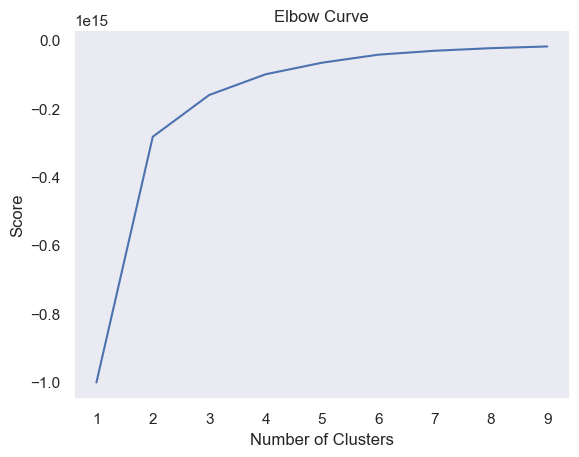

In [ ]:
coords = reg_train1[['lotid', 'latitude', 'longitude']]
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = reg_train1[['latitude']]
X_axis = reg_train1[['longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]

# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [ ]:
def cluster(df):
    
    coords = df[['lotid', 'latitude', 'longitude']]
    
    kmeans = KMeans(n_clusters = 3, init ='k-means++')
    kmeans.fit(coords[coords.columns[1:3]]) # Compute k-means clustering.
    coords['coord_cluster'] = kmeans.fit_predict(coords[coords.columns[1:3]])
    centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
    labels = kmeans.predict(coords[coords.columns[1:3]]) # Labels of each point
    
    # Plot clusters
    coords.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=50, cmap='viridis')
    plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)
    
    # Merge to main dataframe
    coords = coords.drop(['latitude', 'longitude'], axis = 1)
    df = pd.merge(df, coords, on = 'lotid')
    
    return df

,lotid,logerror,transactiondate,aircond,style,basement,numbath,numbedroom,classbuild,qualitybuild,...,fireplace,buildvalue,taxyear,landvalue,totaltaxvalue,taxdelinquencyflag,taxdelinquencyyear,mypointer,parcelvalue,coord_cluster
0,17214744,NaN,NaN,NaN,NaN,NaN,2.0,3,NaN,NaN,...,NaN,103993.0,2015,38219.0,1715.08,NaN,NaN,25711,142212.0,2
1,12018724,NaN,NaN,1.0,NaN,NaN,2.0,1,NaN,4.0,...,NaN,129428.0,2015,171713.0,3851.88,NaN,NaN,13268,301141.0,0
2,11306699,NaN,NaN,1.0,NaN,NaN,3.0,4,NaN,4.0,...,NaN,175069.0,2015,59993.0,3818.24,Y,11.0,5423,235062.0,0
3,11047729,NaN,NaN,1.0,NaN,NaN,2.0,3,NaN,7.0,...,NaN,162926.0,2015,107617.0,3450.67,NaN,NaN,26198,270543.0,0
4,17174848,NaN,NaN,NaN,NaN,NaN,3.0,2,NaN,NaN,...,NaN,180532.0,2015,120354.0,3394.26,NaN,NaN,25187,300886.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22193,10982446,NaN,NaN,1.0,NaN,NaN,2.0,3,NaN,4.0,...,NaN,100617.0,2015,90834.0,2500.21,NaN,NaN,5364,191451.0,0
22194,10848224,NaN,NaN,NaN,NaN,NaN,2.0,2,NaN,7.0,...,NaN,58775.0,2015,74577.0,1756.75,NaN,NaN,13954,133352.0,0
22195,14099461,NaN,NaN,5.0,NaN,NaN,3.0,4,NaN,NaN,...,NaN,222593.0,2016,301251.0,6023.44,NaN,NaN,21163,523844.0,1
22196,10711918,NaN,NaN,1.0,NaN,NaN,3.0,4,NaN,8.0,...,NaN,189088.0,2016,401165.0,7280.94,NaN,NaN,34979,590253.0,0


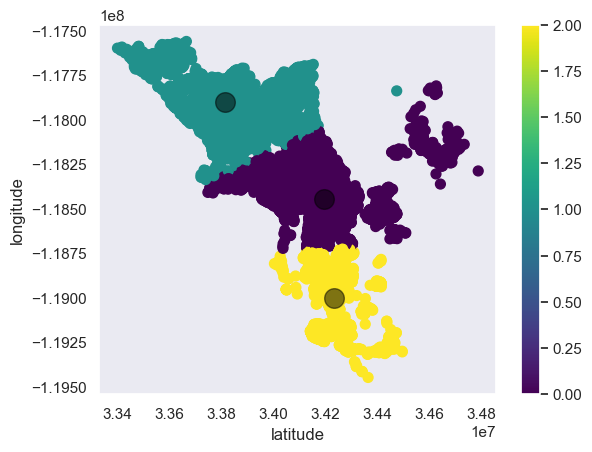

In [ ]:
reg_train1 = cluster(reg_train1)
reg_train1

We observe that the lots in our training set are primarily concentrated within the three regions. 
This characteristic is shared by the lots in our testing set as seen below.

,lotid,logerror,transactiondate,aircond,style,basement,numbath,numbedroom,classbuild,qualitybuild,...,numstories,fireplace,buildvalue,taxyear,landvalue,totaltaxvalue,taxdelinquencyflag,taxdelinquencyyear,mypointer,coord_cluster
0,10987932,NaN,NaN,NaN,NaN,NaN,1.0,3,NaN,7.0,...,NaN,NaN,40368,2015,13504,794.32,Y,13.0,17716,1
1,17171405,NaN,NaN,NaN,NaN,NaN,2.0,4,NaN,NaN,...,2.0,NaN,243265,2015,452361,7767.12,NaN,NaN,30542,2
2,10790981,-0.002,22/7/16,1.0,NaN,NaN,3.0,3,NaN,4.0,...,NaN,NaN,189552,2015,220291,5114.17,NaN,NaN,18707,1
3,14531417,NaN,NaN,NaN,7.0,NaN,2.0,2,NaN,NaN,...,2.0,True,84036,2015,53917,1482.10,NaN,NaN,1151,0
4,11072694,NaN,NaN,1.0,NaN,NaN,3.0,3,NaN,7.0,...,NaN,NaN,303900,2016,464100,9441.19,NaN,NaN,9546,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,10766230,NaN,NaN,1.0,NaN,NaN,2.0,3,NaN,8.0,...,NaN,NaN,111668,2016,275753,4752.47,NaN,NaN,32687,1
196,14412894,NaN,NaN,1.0,NaN,NaN,2.5,4,NaN,NaN,...,NaN,NaN,234457,2016,184146,4183.84,NaN,NaN,30761,0
197,11039638,NaN,NaN,1.0,NaN,NaN,3.0,4,NaN,7.0,...,NaN,NaN,162685,2015,155266,4018.32,NaN,NaN,5973,1
198,17162761,NaN,NaN,NaN,NaN,NaN,2.0,3,NaN,NaN,...,1.0,NaN,45854,2015,18309,754.42,NaN,NaN,3326,2


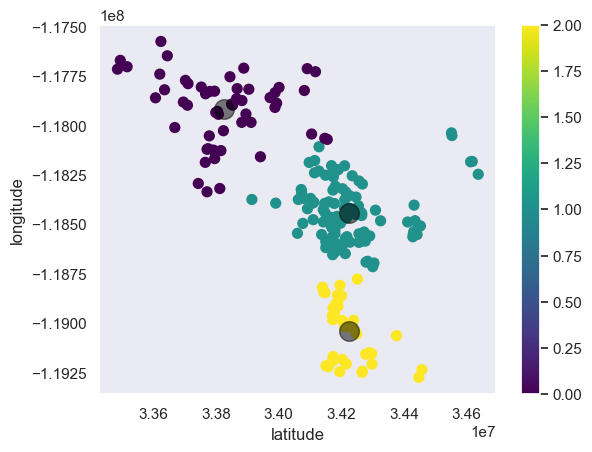

In [ ]:
reg_test1 = cluster(reg_test1)
reg_test1 

## Cleaning the dataset

### Imputing

Before removing missing values, we will impute as much data as possible in order to get a better prediction model. 

`poolnum` contains values equal to 1 or `NaN`. We assume that this variable was orignally created as a dummy variable and that 
the `NaN` values are supposed to be equal to 0.

We then impute `NaN` values for numerical values using the median computed after grouping by `regioncode`.

We do these for both our training and testing set.

In [ ]:

# Fill NaNs in poolnum with 0
reg_train1['poolnum'] = reg_train1['poolnum'].fillna(0)
reg_test1['poolnum'] = reg_test1['poolnum'].fillna(0)

# Fill numerical variables with median by regioncode

fill_cols = ['num34bath',  
             'finishedarea1st', 
             'finishedareaEntry', 
             'numstories', 
             'garagenum', 
             'garagearea', 
             'numbedroom',
             'unitnum', 
             'lotarea', 
             'finishedarea',
             'neighborhoodcode']

med_cols = reg_train1.groupby('regioncode')[fill_cols].median()

# Names of columns we are filling with the median
names_me_columns = []
for var in med_cols:
    name = var+"_me"
    names_me_columns.append(name)


med_cols = med_cols.reset_index()

# Set column names
med_cols.columns = ["regioncode"] + names_me_columns

def impute_na (df):
    
    # Left join with training set
    df = df.merge(med_cols, on= 'regioncode', how='left')

    # Filling some missing values using the median
    for var in fill_cols:
        df[var] = df[var].fillna(df[var+"_me"])

    # Drop the variables we used to fill the missing values with the median      
    df = df.drop(names_me_columns, axis=1)
    
    return df

reg_train1 = impute_na(reg_train1)

reg_test1 = impute_na(reg_test1)

We notice a slight improvement of our dataset, specifically for the variable `neighborhoodcode`.

In [ ]:
# Check the percentage and the number of missing values for each variable 

total = reg_train1.isnull().sum().sort_values(ascending = False)
percent = (reg_train1.isnull().sum() / reg_train1.isnull().count()).sort_values(ascending = False)
missing_data = pd.concat([total, percent], axis = 1, keys = ['Total', 'Percent'])

missing_data

,Total,Percent
perimeterarea,22198,1.000000
classbuild,22183,0.999324
storytype,22152,0.997928
basement,22152,0.997928
totalarea,22141,0.997432
fireplace,22030,0.992432
style,21985,0.990405
material,21970,0.989729
decktype,21559,0.971214
taxdelinquencyflag,21410,0.964501


## Dropping Columns

#### Remove columns with more than 40% of missing values

In [ ]:
limitPer = len(reg_train1) * .60
reg_train1 = reg_train1.dropna(thresh = limitPer, axis = 1)


#### Remove columns `totaltaxvalue`, `buildvalue`, `landvalue`, and `mypointer` from the training and testing set 

In [ ]:
drop_cols = ['totaltaxvalue', 'buildvalue', 'landvalue', 'mypointer']

reg_train1 = reg_train1.drop(columns = drop_cols, axis = 1)
reg_test1 = reg_test1.drop(columns = drop_cols, axis = 1)

#### Remove the observations with remaining missing values from the training dataset.

In [ ]:
reg_train1= reg_train1.dropna()

In [ ]:
reg_train1

,lotid,numbath,numbedroom,finishedarea,countycode,numfireplace,numfullbath,heatingtype,latitude,longitude,...,citycode,countycode2,neighborhoodcode,regioncode,roomnum,unitnum,year,taxyear,parcelvalue,coord_cluster
1,12018724,2.0,1,1033.0,6037,0,2.0,2.0,34092200,-118374000,...,48424.0,3101,274049.0,96050.0,0,1.0,1973.0,2015,301141.0,0
3,11047729,2.0,3,1757.0,6037,0,2.0,2.0,34252019,-118467570,...,12447.0,3101,116646.0,96371.0,0,1.0,1952.0,2015,270543.0,0
6,11016338,3.0,3,1663.0,6037,0,3.0,2.0,34284508,-118493574,...,12447.0,3101,31817.0,96370.0,0,1.0,1961.0,2016,363524.0,0
8,11671803,3.0,3,1777.0,6037,0,3.0,2.0,34076404,-118560997,...,12447.0,3101,19810.0,96120.0,0,1.0,1978.0,2015,329781.0,0
9,11150386,3.0,4,2198.0,6037,0,3.0,2.0,34398126,-118448101,...,54311.0,3101,37739.0,96401.0,0,1.0,2000.0,2015,360647.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22192,10718571,3.0,4,3007.0,6037,0,3.0,2.0,34215285,-118640968,...,12447.0,3101,268588.0,96339.0,0,1.0,1983.0,2015,647437.0,0
22193,10982446,2.0,3,1132.0,6037,0,2.0,2.0,34283637,-118380888,...,12447.0,3101,268249.0,96368.0,0,1.0,1985.0,2015,191451.0,0
22194,10848224,2.0,2,1892.0,6037,0,2.0,7.0,34166936,-118451885,...,12447.0,3101,27080.0,96420.0,0,1.0,1940.0,2015,133352.0,0
22196,10711918,3.0,4,2882.0,6037,0,3.0,2.0,34221662,-118615248,...,12447.0,3101,268588.0,96339.0,0,1.0,1960.0,2016,590253.0,0


The resulting dataset contains 22 columns compared to the original 48. 

#### Removing highly correlated variables

In [ ]:
reg_train1[["numbath", "numfullbath", "parcelvalue"]].corr()

,numbath,numfullbath,parcelvalue
numbath,1.000000,1.000000,0.084989
numfullbath,1.000000,1.000000,0.084989
parcelvalue,0.084989,0.084989,1.000000


In [ ]:
reg_train1[["countycode", "countycode2", "parcelvalue"]].corr()

,countycode,countycode2,parcelvalue
countycode,NaN,NaN,NaN
countycode2,NaN,NaN,NaN
parcelvalue,NaN,NaN,1.0


Of the two pairs of highly correlated variables, `countycode` and `numbath` are more correlated with the target variable `parcelvalue`. Thus, we keep these two and drop their corresponding counterparts.

In [ ]:
# dropping highly correlated columns
reg_train1.drop(['countycode2', 'numfullbath'], axis=1, inplace=True)

reg_train1

,lotid,numbath,numbedroom,finishedarea,countycode,numfireplace,heatingtype,latitude,longitude,lotarea,poolnum,citycode,neighborhoodcode,regioncode,roomnum,unitnum,year,taxyear,parcelvalue,coord_cluster
1,12018724,2.0,1,1033.0,6037,0,2.0,34092200,-118374000,20527.0,1.0,48424.0,274049.0,96050.0,0,1.0,1973.0,2015,301141.0,0
3,11047729,2.0,3,1757.0,6037,0,2.0,34252019,-118467570,8612.0,0.0,12447.0,116646.0,96371.0,0,1.0,1952.0,2015,270543.0,0
6,11016338,3.0,3,1663.0,6037,0,2.0,34284508,-118493574,12102.0,1.0,12447.0,31817.0,96370.0,0,1.0,1961.0,2016,363524.0,0
8,11671803,3.0,3,1777.0,6037,0,2.0,34076404,-118560997,363116.0,0.0,12447.0,19810.0,96120.0,0,1.0,1978.0,2015,329781.0,0
9,11150386,3.0,4,2198.0,6037,0,2.0,34398126,-118448101,5815.0,0.0,54311.0,37739.0,96401.0,0,1.0,2000.0,2015,360647.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22192,10718571,3.0,4,3007.0,6037,0,2.0,34215285,-118640968,10584.0,1.0,12447.0,268588.0,96339.0,0,1.0,1983.0,2015,647437.0,0
22193,10982446,2.0,3,1132.0,6037,0,2.0,34283637,-118380888,5978.0,0.0,12447.0,268249.0,96368.0,0,1.0,1985.0,2015,191451.0,0
22194,10848224,2.0,2,1892.0,6037,0,7.0,34166936,-118451885,13923.0,1.0,12447.0,27080.0,96420.0,0,1.0,1940.0,2015,133352.0,0
22196,10711918,3.0,4,2882.0,6037,0,2.0,34221662,-118615248,11284.0,0.0,12447.0,268588.0,96339.0,0,1.0,1960.0,2016,590253.0,0


## Analyzing the target `parcelvalue`

In order to build the model, we also need to understand the variable we want to predict, and its relation with the other variables.

Text(0.5, 12.44444444444443, 'The total tax assessed value of the parcel')

<Figure size 1000x400 with 0 Axes>

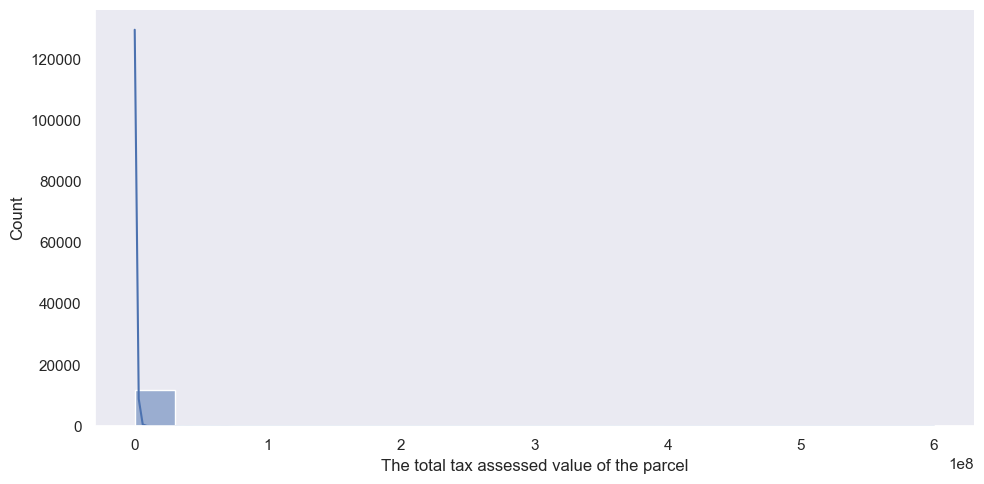

In [ ]:
# Plotting the distribution of parcelvalue
plt.figure(figsize=(10,4))
sns.displot(reg_train1['parcelvalue'],kde = True, bins = 20, aspect = 2)
plt.xlabel('The total tax assessed value of the parcel')

We can see that the distribution for `parcelvalue`  is quite skewed to the right, meaning that the difference between the 25th percentile and the 50th percentile is notably smaller than the difference between the 50th percentile and the 75th percentile. 

Thus, the distribution of properties prices is almost certainly not normal. For this reason, we are going to take its log value and use the resulting variable for our predictions.

In [ ]:
# taking the log value of parcelvalue
reg_train1['parcelvalue'] = np.log(reg_train1['parcelvalue'])

Text(0.5, 12.44444444444443, 'The total tax assessed value of the parcel')

<Figure size 1000x400 with 0 Axes>

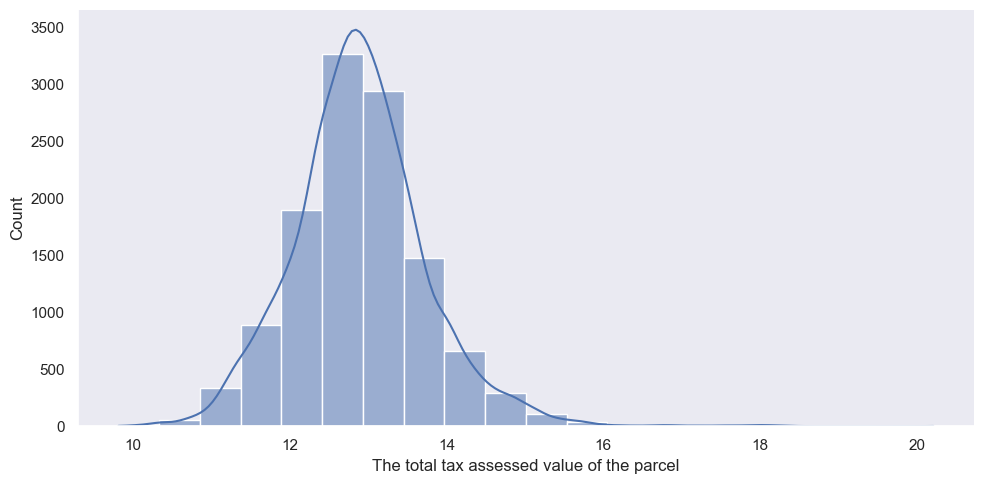

In [ ]:
plt.figure(figsize=(10,4))
sns.displot(reg_train1['parcelvalue'],kde = True, bins = 20, aspect = 2)
plt.xlabel('The total tax assessed value of the parcel')

We also take the log value another continuous numerical variable `finishedarea`

Text(0.5, 12.44444444444443, 'Finished living area')

<Figure size 1000x400 with 0 Axes>

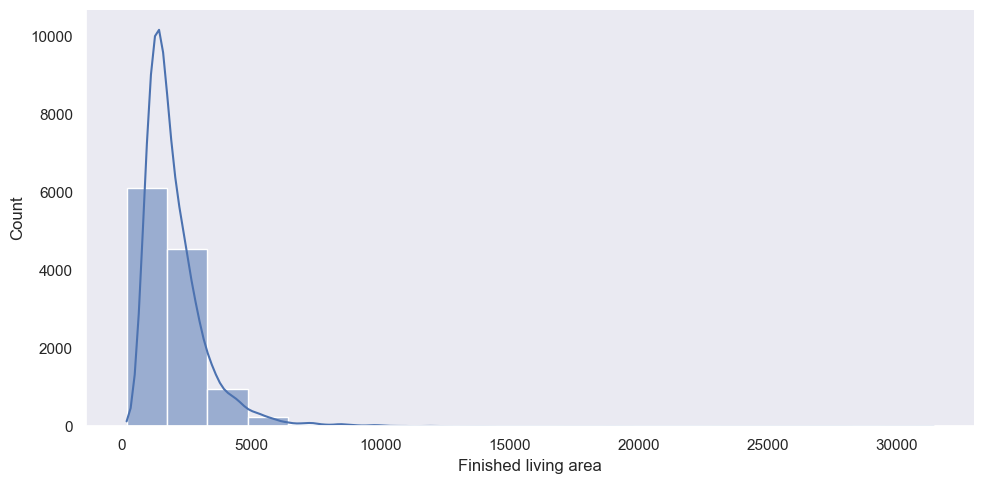

In [ ]:
plt.figure(figsize=(10,4))
sns.displot(reg_train1['finishedarea'],kde = True, bins = 20, aspect = 2)
plt.xlabel('Finished living area')

In [ ]:
# taking the log value of finished area in the training and testing data set
reg_train1['finishedarea'] = np.log(reg_train1['finishedarea'])
reg_test1['finishedarea'] = np.log(reg_test1['finishedarea'])

Text(0.5, 12.44444444444443, 'Finished living area')

<Figure size 1000x400 with 0 Axes>

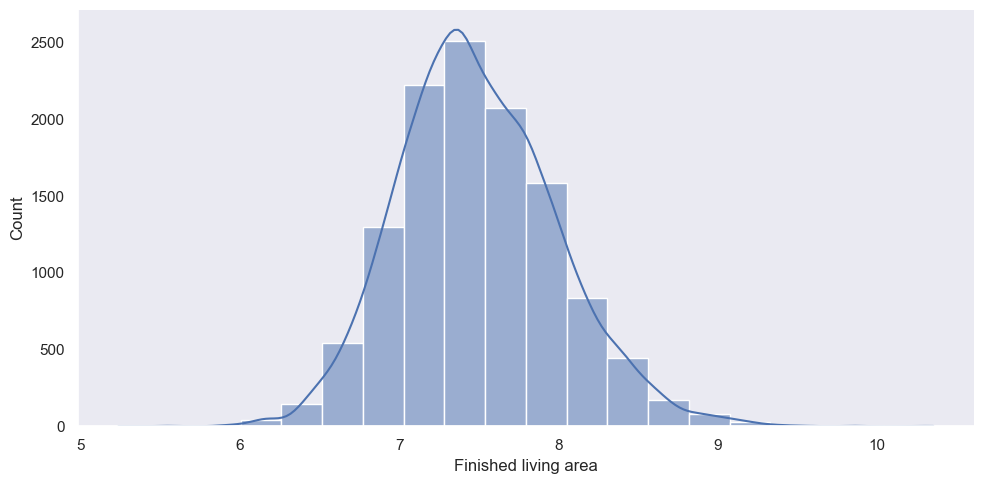

In [ ]:
plt.figure(figsize=(10,4))
sns.displot(reg_train1['finishedarea'],kde = True, bins = 20, aspect = 2)
plt.xlabel('Finished living area')

#### Viewing the relationship between log values of `parcelvalue` and `finishedarea`

We observe a strong positive linear relationship between the two variables 

<AxesSubplot:xlabel='parcelvalue', ylabel='finishedarea'>

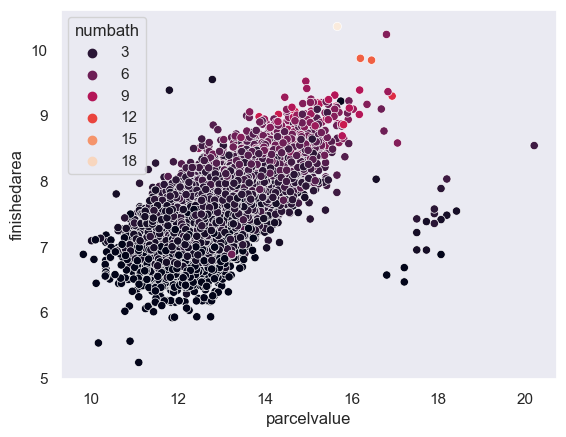

In [ ]:
sns.scatterplot(data = reg_train1, 
                y = reg_train1['finishedarea'], 
                x = reg_train1['parcelvalue'] , 
                hue = 'numbath', 
                palette = 'rocket')


Once the NAs have been dropped, and data has been imputed, we check the Correlation Matrix again. We observe that `parcelvalue` is highly correlated with the following variables:

+ `numbath`
+ `numbedroom`
+ `finishedarea`
+ `regioncode`

<AxesSubplot:>

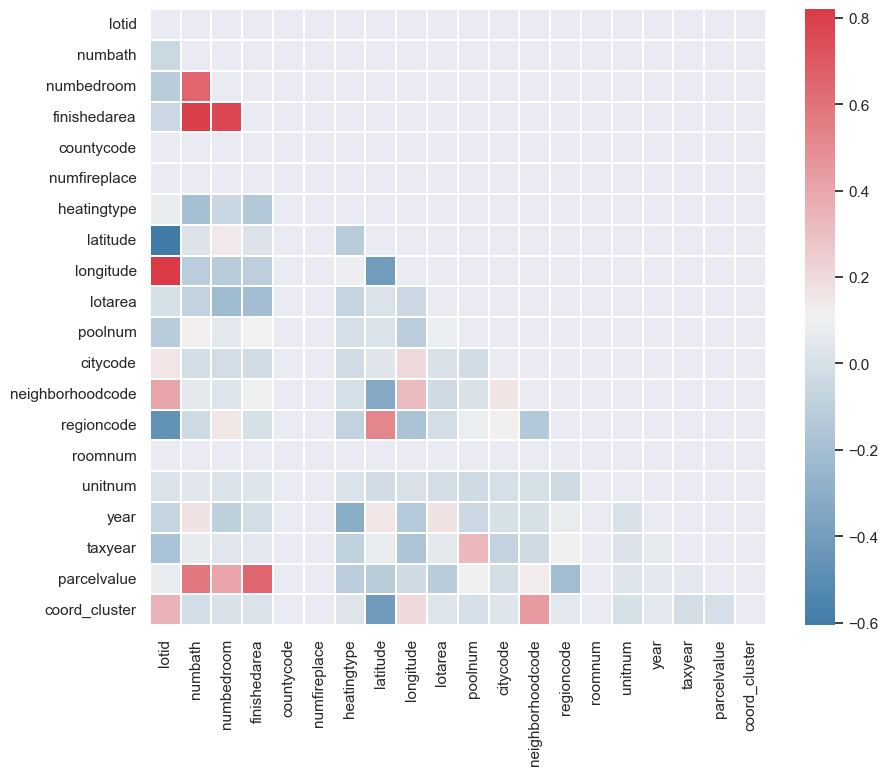

In [ ]:
sns.set_theme(style="dark")

# Compute the correlation matrix
corr = reg_train1.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, square=True, linewidths=.2) 

#### ProfileReport

We also provide below a supplementary report, which we used when we treated our dataset. The report gives an extensive account of each of the variables in our dataset.

In [ ]:
ProfileReport(reg_train1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Dummy Variables

In [ ]:
# Create dummy variables

reg_train1 = pd.get_dummies(reg_train1, 
                            prefix = ['countycode', 'regioncode','neighborhoodcode',"heatingtype", 'citycode'],
                            columns = ['countycode', 'neighborhoodcode', 'regioncode', "heatingtype", 'citycode'], 
                            drop_first = True)

reg_test1 = pd.get_dummies(reg_test1, prefix = ['countycode', 'regioncode','neighborhoodcode',"heatingtype", 'citycode'],
                            columns = ['countycode', 'neighborhoodcode', 'regioncode', "heatingtype", 'citycode'], 
                            drop_first = True)


## Build the model and get predictions

**Model used:** 

Ridge Regression with `log(parcelvalue)`, all regressors scale) from the dataset except: 

+ `lotarea` 
+ `year` 
+ `roomnum` 
+ `unitnum` 

These variable have been dropped since we have seen in previous models that they are not statistically significant.

In addition:

+ imputed missing values 
+ `log(finishedarea)` 
+ `coords`

In [ ]:
# Defining X matrix with all regressors and parcelvalue as the dependent variable, dropping 
# lotid, pacelvalue, lotarea, year, roomnum, and unitnum.

X_train = reg_train1.drop(['lotid', 'parcelvalue','lotarea','year', 'roomnum', 'unitnum'],axis=1)
y_train = reg_train1.parcelvalue 

# Instantiating Scaler 
scaler = StandardScaler()


X_train_scaled = scaler.fit_transform(X_train.values)
X_copy = X_train.copy()
y_copy = y_train.copy()
X_scaled_copy = X_train_scaled.copy()

# Creating dataframe from numpy array to retrieve columns used 
scaled_features_df = pd.DataFrame(X_scaled_copy, index=X_train.index, columns=X_train.columns)

# Instantiating models
ridge_model = Ridge()
lasso_model = Lasso(alpha=.05)
linear_model = LinearRegression()
elastic_model = ElasticNet(alpha=.05)
aic_model = LassoLarsIC(criterion="aic", normalize=True, max_iter=30)

# Defining function to handle model fitting and scoring 

def fit_ml_modelo(modelo, X, y, cv):
    
    # One Pass
    model = modelo.fit(X, y)
    acc = round(model.score(X, y) * 100, 2)
    
    # Cross Validation 
    train_pred = model_selection.cross_val_predict(modelo, 
                                                  X, 
                                                  y, 
                                                  cv=cv, 
                                                  n_jobs = -1)
    # Cross-validation r2 metric
    r2_cv = round(metrics.r2_score(y, train_pred) * 100, 2)
    
    return train_pred, acc, r2_cv

# Ridge Model 
train_pred_ridge, r2_ridge, cv_ridge = fit_ml_modelo(ridge_model, X_scaled_copy, y_copy, 10)
print("R2 with Ridge: %s" % r2_ridge)
print("Score CV: %s" % cv_ridge)

#Lasso Model
train_pred_lasso, r2_lasso, cv_lasso = fit_ml_modelo(lasso_model, X_scaled_copy, y_copy, 10)
print("R2 with Lasso: %s" % r2_lasso)
print("Score CV: %s" % cv_lasso)

#Linear Regression Model
train_pred_linear, r2_linear, cv_linear = fit_ml_modelo(linear_model, X_copy, y_copy, 10)
print("R2 with Simple Linear Regression: %s" % r2_linear)
print("Score CV: %s" % cv_linear)

#ElasticNet Model
train_pred_elastic, r2_elastic, cv_elastic = fit_ml_modelo(elastic_model, X_scaled_copy, y_copy, 10)
print("R2 with ElasticNet: %s" % r2_linear)
print("Score CV: %s" % cv_elastic)

#LassoLarsIC Model
train_pred_aic, r2_aic, cv_aic = fit_ml_modelo(aic_model, X_scaled_copy, y_copy, 10)
print("R2 with LassoLarsIC: %s" % r2_aic)
print("Score CV: %s" % cv_aic)


models = pd.DataFrame({
    'Model': ['Linear Regression', 'Lasso', 'Ridge', 'ElasticNet', 'AIC'],
    'Score': [
        r2_linear, 
        r2_lasso,  
        r2_ridge, 
        r2_elastic,
        r2_aic
    ]})

print("---R2 Scores---")
models.sort_values(by='Score', ascending=False)



R2 with Ridge: 56.75
Score CV: 51.52
R2 with Lasso: 45.98
Score CV: 45.81
R2 with Simple Linear Regression: 56.74
Score CV: 49.02
R2 with ElasticNet: 56.74
Score CV: 49.29


/Users/luisquinonespr/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_least_angle.py:652: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e. alpha=3.053e-04, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
  warnings.warn(
/Users/luisquinonespr/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_least_angle.py:652: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 21 iterations, i.e. alpha=3.814e-04, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
  warnings.warn(
/Users/luisquinonespr/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_least_angle.py:652: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=3.734e-04, with a

R2 with LassoLarsIC: 49.05
Score CV: 48.75
---R2 Scores---


,Model,Score
2,Ridge,56.75
0,Linear Regression,56.74
3,ElasticNet,49.75
4,AIC,49.05
1,Lasso,45.98


In [ ]:
models = pd.DataFrame({
    'Model': ['Linear Regression', 'Lasso', 'Ridge', 'ElasticNet', 'AIC'],
    'Score': [
        cv_linear, 
        cv_lasso,  
        cv_ridge,
        cv_elastic,
        cv_aic,
    ]})
print("---CV Scores---")
models.sort_values(by='Score', ascending=False)


---CV Scores---


,Model,Score
2,Ridge,51.52
3,ElasticNet,49.29
0,Linear Regression,49.02
4,AIC,48.75
1,Lasso,45.81


Check the results from the model:

In [ ]:
model_linear = sm.OLS(y_train, sm.add_constant(X_train))
original_linear = model_linear.fit()
print(original_linear.summary())

                            OLS Regression Results                            
Dep. Variable:            parcelvalue   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.549
Method:                 Least Squares   F-statistic:                     30.39
Date:                Sun, 06 Nov 2022   Prob (F-statistic):               0.00
Time:                        19:20:52   Log-Likelihood:                -10046.
No. Observations:               11986   AIC:                         2.109e+04
Df Residuals:                   11489   BIC:                         2.476e+04
Df Model:                         496                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

## Model Evaluation

Checking how our model is doing for predicting the parcelvalue in the training dataset that we already know (insample predictions).

In [ ]:
y = ridge_model.predict(X_scaled_copy) #Insample predictions

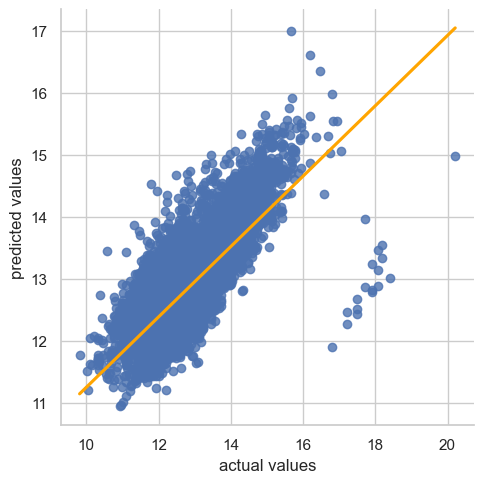

In [ ]:
sns.set_theme(style="whitegrid")
sns.lmplot(x="actual values", y="predicted values", data = pd.DataFrame({"actual values": y_copy, "predicted values": y}), ci=None,line_kws={'color': 'orange'})
ax = plt.gca()

In [ ]:
# Create X test for predictions
X_test = reg_test1.drop(["lotid"], axis = 1)

# Get missing columns in the training test
missing_cols = set(scaled_features_df.columns ) - set( X_test.columns)

# Add a missing column in test set with default value equal to 0
for c in missing_cols:
            X_test[c] = 0
# Ensure the order of column in the test set is in the same order than in train set
X_test = X_test[scaled_features_df.columns]

X_test = X_test.copy()

X_test = scaler.transform(X_test)

predictions = ridge_model.predict(X_test)

submission = pd.DataFrame()
submission['lotid'] = reg_test1['lotid']
submission['parcelvalue'] = predictions # our model predictions on the test dataset
submission.to_csv("submission.csv", index = False)

submission

,lotid,parcelvalue
0,10987932,12.021650
1,17171405,12.978425
2,10790981,12.561674
3,14531417,13.402513
4,11072694,13.251462
...,...,...
195,10766230,12.466784
196,14412894,13.921933
197,11039638,12.029946
198,17162761,12.792648


We concluded by choosing the Ridge as our model, as it contained our highest CV score. 